In [1]:
import ee
import geojson
import pandas_gbq as gbq
import geopandas as gpd
import pandas as pd
from shapely.geometry import shape
from shapely import wkt
from collections import defaultdict

import geemap
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm, gamma, f, chi2

In [2]:
service_account = 'clgx-gis-app-dev-06e3@appspot.gserviceaccount.com'
service_account_key_file = r'G:\Shared drives\Spatial_Solutions\engineering\sa_keys\gis_app_terminal_server\terminal-server-SA.json'
# Authenticate to Google Cloud
credentials = ee.ServiceAccountCredentials(
    service_account,
    service_account_key_file
)
ee.Initialize(credentials)



In [44]:

BigQuery_SQL = """
SELECT * FROM `clgx-gis-app-dev-06e3.work_ttindell.sdp_growth_parcels` growthp where growthp.geom is not null and growthp.puid = '8383762602'
"""
# Get the BigQuery table
table = gbq.read_gbq(
    BigQuery_SQL,
    project_id='clgx-gis-app-dev-06e3',
    dialect='standard'
)

# if table is empty, throw error
if table.empty:
    raise ValueError('The BigQuery table is empty.')

# detect the geometry column
geometry_column = None
for column in table.columns:
    if column.lower() == 'geometry' or column.lower() == 'geography' or column.lower() == 'geom':
        geometry_column = column
        break
if geometry_column is None:
    raise ValueError('The BigQuery table does not have a geometry column.')

# convert the geometry column to GeoJSON
table[geometry_column] = table[geometry_column].apply(lambda x: geojson.Feature(geometry=wkt.loads(x)))


Downloading: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████|


In [90]:

ee_table = ee.FeatureCollection([table['geom'][0]])

# loop through the stats and calculate zonal stats on each feature in table
# initialize the image collection
image_collection = ee.ImageCollection('COPERNICUS/S1_GRD').filterDate(ee.Date('2021-08-01'), ee.Date('2023-08-01')).filterBounds(ee_table).sort('system:time_start')
aoi = image_collection.filterBounds(ee_table)

smimages = image_collection.filter(ee.Filter.eq('resolution_meters', 10)).filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV')).filter(ee.Filter.eq('orbitProperties_pass', 'ASCENDING')).filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VH'))
#.filterMetadata('relativeOrbitNumber_start', 'equals', 136)
fixed_ic = smimages.map(lambda image: image.reproject(crs= 'EPSG:32614',scale= 10))
#filterMetadata('orbitNumber_start', 'equals', 23104)
Map = geemap.Map()
image = aoi.first()

vis_params = {
    'bands': ['VH','VV','HH'],
    'min': -10,
    'max': 10,
    'gamma': .1
}

Map.addLayer(image)
Map.centerObject(image)

In [91]:
aoi_sub = ee_table.geometry()
im_list = fixed_ic.toList(image_collection.size())
fixed_ic




In [50]:
im1 = ee.Image(im_list.get(0)).select('VV').clip(aoi_sub)
im2 = ee.Image(im_list.get(im_list.length().subtract(ee.Number(1)))).select('VV').clip(aoi_sub)
ratio = im1.divide(im2)
ratio_f = ratio.reproject('EPSG:32623')


vis_params = {
    'bands': ['VV'],
    'min': 0,
    'max': 1,
    'gamma': .1
}
Map2 = geemap.Map()
Map2.addLayer(ratio,vis_params, name ='ratio', shown = True,opacity = .75)
Map2.addLayer(im1,vis_params, name ='im1', shown = True,opacity = 0)
Map2.addLayer(im2,vis_params, name ='im2', shown = True,opacity = 0)
Map2.centerObject(aoi_sub,15)



In [51]:
Map2

Map(center=[29.416839715548576, -98.75047384855036], controls=(WidgetControl(options=['position', 'transparent…

In [52]:
hist = ratio.reduceRegion(ee.Reducer.fixedHistogram(0, 5, 500), aoi_sub).get('VV').getInfo()
mean = ratio.reduceRegion(ee.Reducer.mean(), aoi_sub).get('VV').getInfo()
variance = ratio.reduceRegion(ee.Reducer.variance(), aoi_sub).get('VV').getInfo()


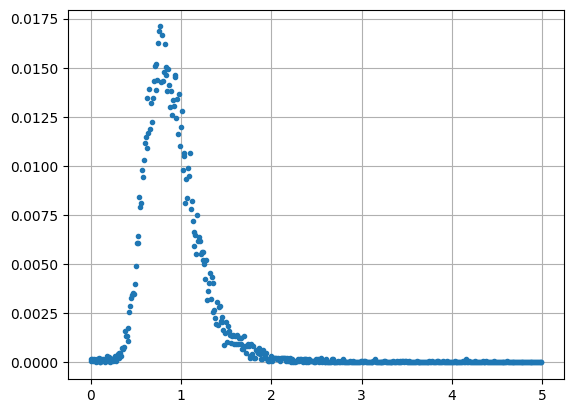

In [53]:
a = np.array(hist)
x = a[:, 0]
y = a[:, 1] / np.sum(a[:, 1])
plt.grid()
plt.plot(x, y, '.')
plt.show()


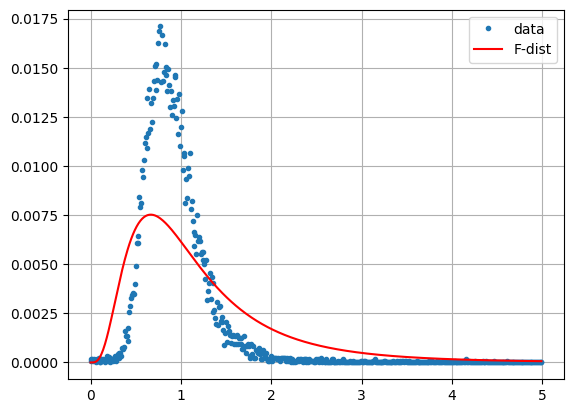

In [54]:
m = 5
plt.grid()
plt.plot(x, y, '.', label='data')
plt.plot(x, f.pdf(x, 2*m, 2*m) / 100, '-r', label='F-dist')
plt.legend()
plt.show()


In [55]:
print(mean, m/(m-1))
print(variance, m*(2*m-1)/(m-1)**2/(m-2))


0.9292981096415847 1.25
4.76445717488273 0.9375


In [56]:
dt = f.ppf(0.0005, 2*m, 2*m)

# LRT statistics.
q1 = im1.divide(im2)
q2 = im2.divide(im1)

# Change map with 0 = no change, 1 = decrease, 2 = increase in intensity.
c_map = im1.multiply(0).where(q2.lt(dt), 1)
c_map = c_map.where(q1.lt(dt), 2)


# Mask no-change pixels.
#c_map = c_map.updateMask(c_map.gt(0))
c_map = c_map.set('system:footprint', q2.geometry())

location = aoi_sub.centroid().coordinates().getInfo()[::-1]


In [57]:

vis_p_ratio = {'min': 0, 'max': 2, 'palette': ['000000', 'FFFFFF']}
vis_p_cmap = {'bands': ['VV'],'min': 0, 'max': 2, 'palette': ['000000', '0000FF','FF0000']}
Map3 = geemap.Map()
Map3.addLayer(ratio,vis_p_ratio, name ='Ratio', shown = True,opacity = 0)
Map3.addLayer(c_map,vis_p_cmap, name ='Change Map', shown = True,opacity = .6)
Map3.centerObject(aoi_sub,15)
Map3

Map(center=[29.416839715548576, -98.75047384855036], controls=(WidgetControl(options=['position', 'transparent…

In [23]:
def det(im):
  return im.expression('b(0) * b(1)')

# Number of looks.
m = 5

im1 = ee.Image(im_list.get(0)).select('VV', 'VH').clip(aoi_sub)
im2 = ee.Image(im_list.get(1)).select('VV', 'VH').clip(aoi_sub)

m2logQ = det(im1).log().add(det(im2).log()).subtract(
    det(im1.add(im2)).log().multiply(2)).add(4*np.log(2)).multiply(-2*m)



In [24]:
def chi2cdf(chi2, df):
  ''' Chi square cumulative distribution function for df degrees of freedom
      using the built-in incomplete gamma function gammainc() '''
  return ee.Image(chi2.divide(2)).gammainc(ee.Number(df).divide(2))

# The observed test statistic image -2logq.
m2logq = det(im1).log().add(det(im2).log()).subtract(
    det(im1.add(im2)).log().multiply(2)).add(4*np.log(2)).multiply(-2*m)

# The P value image prob(m2logQ > m2logq) = 1 - prob(m2logQ < m2logq).
p_value = ee.Image.constant(1).subtract(chi2cdf(m2logq, 2))

# Project onto map.
vis_p_p_value = {'bands': ['constant'],'min': 0, 'max': 1, 'palette': ['000000', 'FFFFFF']}
Map4 = geemap.Map()
Map4.addLayer(p_value,vis_p_p_value, name ='P Value', shown = True,opacity = .6)
Map4.centerObject(aoi_sub,15)
Map4



Map(center=[29.53648030299474, -98.71809003205323], controls=(WidgetControl(options=['position', 'transparent_…

In [16]:
clipped = fixed_ic.map(lambda image: image.clip(aoi_sub))

In [17]:
clipped

In [198]:
#vvArray = clipped.map(lambda image: ee.Image(image.date().get('year')).add(image.date().getFraction('year'))).toArray()
#VV_mean = clipped.mean()
#cumSumArray = vvArray.arraySlice(1, 0, 1).subtract(VV_mean).arrayAccum(0, ee.Reducer.sum()).arrayCat(vvArray.arraySlice(1, 1), 1)
#residuals = ee.Image(clipped.get('last')).subtract(cumSumArray)
#imagesum = residuals.arrayAccum(0, ee.Reducer.sum())
#max = imagesum.max(0)
#min = imagesum.min(0)
#magnitude = max.subtract(min)

In [200]:
#vis_p_resid = {'bands': ['VV'],'min': 0, 'max': 1,'gamma': .1}
#Map5 = geemap.Map()
#Map5.addLayer(residuals,vis_p_resid, name ='mean', shown = True,opacity = 1)
#Map5.addLayer(magnitude, name ='magnitude', shown = True,opacity = .6)
#Map5.centerObject(aoi_sub,15)
#Map5

In [47]:
###Start of time series change detection - google tutorial part 3

def clip_img(img):
    """Clips a list of images."""
    return ee.Image(img).clip(aoi_sub)

im_list = fixed_ic.toList(fixed_ic.size())
im_list = ee.List(im_list.map(clip_img))

im_list.length().getInfo()


93

In [61]:
def selectvv(current):
    return ee.Image(current).select('VV')
vv_list = im_list.map(selectvv)
rgb_images = (ee.Image.rgb(vv_list.get(1), vv_list.get(2), vv_list.get(3))
              .log10().multiply(10))


In [62]:
vis_p_rgb = {'bands': ['vis-red','vis-green','vis-blue'],'min': -20, 'max': 0, 'gamma': [1, 1, 1]}
Map5 = geemap.Map()
Map5.addLayer(rgb_images,vis_p_rgb, name ='mean', shown = True,opacity = 1)
Map5.centerObject(aoi_sub,15)
Map5

Map(center=[29.416839715548576, -98.75047384855036], controls=(WidgetControl(options=['position', 'transparent…

In [42]:
alpha = 0.01
1-(1-alpha)**25

def omnibus(im_list, m = 4.4):
    """Calculates the omnibus test statistic, monovariate case."""
    def log(current):
        return ee.Image(current).log()

    im_list = ee.List(im_list)
    k = im_list.length()
    klogk = k.multiply(k.log())
    klogk = ee.Image.constant(klogk)
    sumlogs = ee.ImageCollection(im_list.map(log)).reduce(ee.Reducer.sum())
    logsum = ee.ImageCollection(im_list).reduce(ee.Reducer.sum()).log()
    return klogk.add(sumlogs).subtract(logsum.multiply(k)).multiply(-2*m)




In [43]:
k = 100
hist = (omnibus(vv_list.slice(0,k))
        .reduceRegion(ee.Reducer.fixedHistogram(0, 40, 200), geometry=aoi_sub, scale=10)
        .get('constant')
        .getInfo())

a = np.array(hist)
x = a[:,0]
y = a[:,1]/np.sum(a[:,1])
plt.plot(x, y, '.', label='data')
plt.plot(x, chi2.pdf(x, k-1)/5, '-r', label='chi square')
plt.legend()
plt.grid()
plt.show()


IndexError: too many indices for array: array is 0-dimensional, but 2 were indexed

In [59]:
k = 100; alpha = 0.01
p_value = ee.Image.constant(1).subtract(chi2cdf(omnibus(vv_list), k-1))
c_map = p_value.multiply(0).where(p_value.lt(alpha), 1)
# Make the no-change pixels transparent.
c_map = c_map.updateMask(c_map.gt(0))
c_map

In [60]:
vis_p_rgb = {'bands': ['constant'],'min': 0, 'max': 1, 'palette': ['000000', 'FFFFFF']}
Map6 = geemap.Map()
Map6.addLayer(c_map,vis_p_rgb, name ='mean', shown = True,opacity = 1)
Map6.centerObject(aoi_sub,15)
Map6

Map(center=[29.416839715548576, -98.75047384855036], controls=(WidgetControl(options=['position', 'transparent…

In [92]:
def specle_filterVV(img):
    vv = img.select('VV')
    vv_smoothed = vv.focal_median(50,'circle','meters').rename('VV_Filtered')
    return img.addBands(vv_smoothed)

def specle_filterVH(img):
    vh = img.select('VH')
    vh_smoothed = vh.focal_median(50,'circle','meters').rename('VH_Filtered')
    return img.addBands(vh_smoothed)
filterd_ic = fixed_ic.map(specle_filterVV)
filterd_ic = filterd_ic.map(specle_filterVH)

def dpsvi(img):
    dpsvi = ((img.select('VV_Filtered').add(img.select('VH_Filtered'))).divide(img.select('VV_Filtered'))).rename('DPSVI')
    return img.addBands(dpsvi)



filterd_ic = filterd_ic.map(dpsvi)

In [93]:
filterd_ic
im_list = filterd_ic.toList(filterd_ic.size())
im_list = ee.List(im_list.map(clip_img))
im1 = ee.Image(im_list.get(0)).select('DPSVI').clip(aoi_sub)
im2 = ee.Image(im_list.get(im_list.length().subtract(ee.Number(1)))).select('DPSVI').clip(aoi_sub)
difference = im1.select('DPSVI').subtract(im2.select('DPSVI'))

In [99]:

vis_p_test = {'bands': ['DPSVI'],'min': -1, 'max': 1, 'palette': ['000000', '0000FF','FF0000']}
Map7 = geemap.Map()
Map7.addLayer(difference,vis_p_test, name ='difference', shown = True,opacity = 1)
Map7.addLayer(im2,vis_p_test, name ='2023', shown = True,opacity = 0)
Map7.addLayer(im1,vis_p_test, name ='2021', shown = True,opacity = 0)
Map7.centerObject(aoi_sub,15)
Map7

Map(center=[29.416839715548576, -98.75047384855036], controls=(WidgetControl(options=['position', 'transparent…

In [101]:
filterd_ic